Analyst: Quynh Duong

Project title: Bike Share Customer Analysis/A new marketing strategy

**I. Introduction**

Cyclistic is a bike-share company in Chicago that features more than 5,800 bicycles and 600 docking stations. Customers who purchase single-ride or full-day passes are referred to as casual riders. Customers who purchase annual memberships are Cyclistic members.
Cyclistic’s finance analysts have concluded that annual members are much more profitable than casual riders. Rather than creating a marketing campaign that targets all-new customers, we believe there is a very good chance to convert casual riders into members. 

**II. Analysis** 

* Business Task

A clear goal: Marketing strategy recommendations aimed at converting casual riders into annual members.

My task: Identify how casual riders and annual members use Cyclistic bikes differently over the past 12 months

# * Data Preparing

The data has been made available by Motivate International Inc. under this license. This 
Divvy_trip_data contains datasets during years from 2013-2022, I decided to choose the last 12 month datasets to work on to get the best result.

12 month trip data from September, 2021 to August, 2022 that are stored in a total of 12 CSV files were collected and downloaded from Divvy_trip_data, and they are stored in a folder on my Mac named Bike_share_trip_2021-2022.

Each dataset collected include 13 attributes which help us answer the business questions: 

* ride_id (categorical): a unique ID per ride

* rideable_type (categorical): the type of bicycle used

* started_at (datetime): the date and time that the bicycle was checked out 

* ended_at (datetime): the date and time that the bicycle was checked in

* start_station_name (categorical): the name of the start station 

* start_station_id (categorical): a unique ID per the start station 

* end_station_name (categorical): the name of the end station  

* end_station_id (categorical): a unique ID per the end station 

* start_lat (numeric): the latitude of the start station

* start_lng (numeric): the longitude of the start station

* end_lat (numeric): the latitude of the end station

* end_lng (numeric): the longitude of the end station

* member_casual (categorical): customer types

****Previewing all the datasets: ****

* Some Null values and inconsitent formats 

* Trip time conflicts 

* Mising information in some fields (start_station_name, end_station_name,..)

I decided to use Rstudio during preparing data as well as cleaning and processing data in RStudio because data cleaning in spreadsheets can be time-consuming and slow compared to R or SQL. 

* Installing and loading libraries: Those libraries below will be used during processing and analyzing. 



In [ ]:
>library('tidyverse')
── Attaching packages ────────────────────────────────────────── tidyverse 1.3.2 ──
✔ ggplot2 3.3.6      ✔ purrr  0.3.4 
✔ tibble 3.1.8      ✔ dplyr  1.0.10
✔ tidyr  1.2.1      ✔ stringr 1.4.1 
✔ readr  2.1.2      ✔ forcats 0.5.2 
── Conflicts ───────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
> library('lubridate')

Attaching package: ‘lubridate’

The following objects are masked from ‘package:base’:

    date, intersect, setdiff, union
> library('data.table')
data.table 1.14.2 using 8 threads (see ?getDTthreads).  Latest news: r-datatable.com

Attaching package: ‘data.table’

The following objects are masked from ‘package:lubridate’:

    hour, isoweek, mday, minute, month, quarter, second, wday, week,
    yday, year

The following objects are masked from ‘package:dplyr’:

    between, first, last

The following object is masked from ‘package:purrr’:

    transpose
> library("janitor")

Attaching package: ‘janitor’

The following objects are masked from ‘package:stats’:

    chisq.test, fisher.test
> library("sqldf")
Loading required package: gsubfn
Loading required package: proto
tcltk DLL is linked to '/opt/X11/lib/libX11.6.dylib'
Could not load tcltk.  Will use slower R code instead.
Loading required package: RSQLite
Warning message:
In doTryCatch(return(expr), name, parentenv, handler) :
  unable to load shared object '/Library/Frameworks/R.framework/Resources/modules//R_X11.so':
  dlopen(/Library/Frameworks/R.framework/Resources/modules//R_X11.so, 0x0006): Library not loaded: '/opt/X11/lib/libSM.6.dylib'
  Referenced from: '/Library/Frameworks/R.framework/Versions/4.2-arm64/Resources/modules/R_X11.so'
  Reason: tried: '/opt/X11/lib/libSM.6.dylib' (no such file), '/usr/local/lib/libSM.6.dylib' (no such file), '/usr/lib/libSM.6.dylib' (no such file)



* Importing all the 6 .csv files into 6 data frames: 


In [ ]:
trip_data_202109 <- read.csv("/Users/quinnduong/Documents/Bike_share_trip_2021-2022/202109-divvy-tripdata.csv")
trip_data_202110 <- read.csv("/Users/quinnduong/Documents/Bike_share_trip_2021-2022/202110-divvy-tripdata.csv")
trip_data_202111 <- read.csv("/Users/quinnduong/Documents/Bike_share_trip_2021-2022/202111-divvy-tripdata.csv")
trip_data_202112 <- read.csv("/Users/quinnduong/Documents/Bike_share_trip_2021-2022/202112-divvy-tripdata.csv")
trip_data_202201 <- read.csv("/Users/quinnduong/Documents/Bike_share_trip_2021-2022/202201-divvy-tripdata.csv")
trip_data_202202 <- read.csv("/Users/quinnduong/Documents/Bike_share_trip_2021-2022/202202-divvy-tripdata.csv")
trip_data_202203 <- read.csv("/Users/quinnduong/Documents/Bike_share_trip_2021-2022/202203-divvy-tripdata.csv")
trip_data_202204 <- read.csv("/Users/quinnduong/Documents/Bike_share_trip_2021-2022/202204-divvy-tripdata.csv")
trip_data_202205 <- read.csv("/Users/quinnduong/Documents/Bike_share_trip_2021-2022/202205-divvy-tripdata.csv")
trip_data_202206 <- read.csv("/Users/quinnduong/Documents/Bike_share_trip_2021-2022/202206-divvy-tripdata.csv")
trip_data_202207 <- read.csv("/Users/quinnduong/Documents/Bike_share_trip_2021-2022/202207-divvy-tripdata.csv")
trip_data_202208 <- read.csv("/Users/quinnduong/Documents/Bike_share_trip_2021-2022/202208-divvy-tripdata.csv")


* Check column names of each dataset for consistency

In [ ]:
colnames(trip_data_202109)
colnames(trip_data_202110)
colnames(trip_data_202111)
colnames(trip_data_202112)
colnames(trip_data_202201)
colnames(trip_data_202202)
colnames(trip_data_202203)
colnames(trip_data_202204)
colnames(trip_data_202205)
colnames(trip_data_202206)
colnames(trip_data_202207)
colnames(trip_data_202208)


> colnames(trip_data_202109)

 [1] "ride_id"            "rideable_type"      "started_at"         "ended_at"           "start_station_name" "start_station_id"   "end_station_name"   "end_station_id"     "start_lat"  [10] "start_lng"          "end_lat"            "end_lng"            "member_casual"   
> colnames(trip_data_202110)

 [1] "ride_id"            "rideable_type"      "started_at"         "ended_at"           "start_station_name" "start_station_id"   "end_station_name"   "end_station_id"     "start_lat"  [10] "start_lng"          "end_lat"            "end_lng"            "member_casual"   
> colnames(trip_data_202111)

 [1] "ride_id"            "rideable_type"      "started_at"         "ended_at"           "start_station_name" "start_station_id"   "end_station_name"   "end_station_id"     "start_lat"  [10] "start_lng"          "end_lat"            "end_lng"            "member_casual"   
> colnames(trip_data_202112)

 [1] "ride_id"            "rideable_type"      "started_at"         "ended_at"           "start_station_name" "start_station_id"   "end_station_name"   "end_station_id"     "start_lat"  [10] "start_lng"          "end_lat"            "end_lng"            "member_casual"   
> colnames(trip_data_202201)

 [1] "ride_id"            "rideable_type"      "started_at"         "ended_at"           "start_station_name" "start_station_id"   "end_station_name"   "end_station_id"     "start_lat"  [10] "start_lng"          "end_lat"            "end_lng"            "member_casual"          
> colnames(trip_data_202202)

 [1] "ride_id"            "rideable_type"      "started_at"         "ended_at"           "start_station_name" "start_station_id"   "end_station_name"   "end_station_id"     "start_lat"  [10] "start_lng"          "end_lat"            "end_lng"            "member_casual"         
> colnames(trip_data_202203)

 [1] "ride_id"            "rideable_type"      "started_at"         "ended_at"           "start_station_name" "start_station_id"   "end_station_name"   "end_station_id"     "start_lat"  [10] "start_lng"          "end_lat"            "end_lng"            "member_casual"       
> colnames(trip_data_202204)

 [1] "ride_id"            "rideable_type"      "started_at"         "ended_at"           "start_station_name" "start_station_id"   "end_station_name"   "end_station_id"     "start_lat"  [10] "start_lng"          "end_lat"            "end_lng"            "member_casual"   
> colnames(trip_data_202205)

 [1] "ride_id"            "rideable_type"      "started_at"         "ended_at"           "start_station_name" "start_station_id"   "end_station_name"   "end_station_id"     "start_lat"  [10] "start_lng"          "end_lat"            "end_lng"            "member_casual"         
> colnames(trip_data_202206)

 [1] "ride_id"            "rideable_type"      "started_at"         "ended_at"           "start_station_name" "start_station_id"   "end_station_name"   "end_station_id"     "start_lat"  [10] "start_lng"          "end_lat"            "end_lng"            "member_casual"   
 > colnames(trip_data_202207)
 
 [1] "ride_id"            "rideable_type"      "started_at"         "ended_at"           "start_station_name" "start_station_id"   "end_station_name"   "end_station_id"     "start_lat"  [10] "start_lng"          "end_lat"            "end_lng"            "member_casual"     
> colnames(trip_data_202208)

 [1] "ride_id"            "rideable_type"      "started_at"         "ended_at"           "start_station_name" "start_station_id"   "end_station_name"   "end_station_id"     "start_lat"  [10] "start_lng"          "end_lat"            "end_lng"            "member_casual"  
 

* Check structures and formats of all dataframes

In [ ]:
> str(trip_data_202109)
'data.frame':	756147 obs. of  13 variables:
 $ ride_id           : chr  "9DC7B962304CBFD8" "F930E2C6872D6B32" "6EF72137900BB910" "78D1DE133B3DBF55" ...
 $ rideable_type     : chr  "electric_bike" "electric_bike" "electric_bike" "electric_bike" ...
 $ started_at        : chr  "2021-09-28 16:07:10" "2021-09-28 14:24:51" "2021-09-28 00:20:16" "2021-09-28 14:51:17" ...
 $ ended_at          : chr  "2021-09-28 16:09:54" "2021-09-28 14:40:05" "2021-09-28 00:23:57" "2021-09-28 15:00:06" ...
 $ start_station_name: chr  "" "" "" "" ...
 $ start_station_id  : chr  "" "" "" "" ...
 $ end_station_name  : chr  "" "" "" "" ...
 $ end_station_id    : chr  "" "" "" "" ...
 $ start_lat         : num  41.9 41.9 41.8 41.8 41.9 ...
 $ start_lng         : num  -87.7 -87.6 -87.7 -87.7 -87.7 ...
 $ end_lat           : num  41.9 42 41.8 41.8 41.9 ...
 $ end_lng           : num  -87.7 -87.7 -87.7 -87.7 -87.7 ...
 $ member_casual     : chr  "casual" "casual" "casual" "casual" ...


In [ ]:
> str(trip_data_202110)
'data.frame':	631226 obs. of  13 variables:
 $ ride_id           : chr  "620BC6107255BF4C" "4471C70731AB2E45" "26CA69D43D15EE14" "362947F0437E1514" ...
 $ rideable_type     : chr  "electric_bike" "electric_bike" "electric_bike" "electric_bike" ...
 $ started_at        : chr  "2021-10-22 12:46:42" "2021-10-21 09:12:37" "2021-10-16 16:28:39" "2021-10-16 16:17:48" ...
 $ ended_at          : chr  "2021-10-22 12:49:50" "2021-10-21 09:14:14" "2021-10-16 16:36:26" "2021-10-16 16:19:03" ...
 $ start_station_name: chr  "Kingsbury St & Kinzie St" "" "" "" ...
 $ start_station_id  : chr  "KA1503000043" "" "" "" ...
 $ end_station_name  : chr  "" "" "" "" ...
 $ end_station_id    : chr  "" "" "" "" ...
 $ start_lat         : num  41.9 41.9 41.9 41.9 41.9 ...
 $ start_lng         : num  -87.6 -87.7 -87.7 -87.7 -87.7 ...
 $ end_lat           : num  41.9 41.9 41.9 41.9 41.9 ...
 $ end_lng           : num  -87.6 -87.7 -87.7 -87.7 -87.7 ...
 $ member_casual     : chr  "member" "member" "member" "member" ...


In [ ]:
> str(trip_data_202111)
'data.frame':	359978 obs. of  13 variables:
 $ ride_id           : chr  "7C00A93E10556E47" "90854840DFD508BA" "0A7D10CDD144061C" "2F3BE33085BCFF02" ...
 $ rideable_type     : chr  "electric_bike" "electric_bike" "electric_bike" "electric_bike" ...
 $ started_at        : chr  "2021-11-27 13:27:38" "2021-11-27 13:38:25" "2021-11-26 22:03:34" "2021-11-27 09:56:49" ...
 $ ended_at          : chr  "2021-11-27 13:46:38" "2021-11-27 13:56:10" "2021-11-26 22:05:56" "2021-11-27 10:01:50" ...
 $ start_station_name: chr  "" "" "" "" ...
 $ start_station_id  : chr  "" "" "" "" ...
 $ end_station_name  : chr  "" "" "" "" ...
 $ end_station_id    : chr  "" "" "" "" ...
 $ start_lat         : num  41.9 42 42 41.9 41.9 ...
 $ start_lng         : num  -87.7 -87.7 -87.7 -87.8 -87.6 ...
 $ end_lat           : num  42 41.9 42 41.9 41.9 ...
 $ end_lng           : num  -87.7 -87.7 -87.7 -87.8 -87.6 ...
 $ member_casual     : chr  "casual" "casual" "casual" "casual" ...

In [ ]:
> str(trip_data_202112)
'data.frame':	247540 obs. of  13 variables:
 $ ride_id           : chr  "46F8167220E4431F" "73A77762838B32FD" "4CF42452054F59C5" "3278BA87BF698339" ...
 $ rideable_type     : chr  "electric_bike" "electric_bike" "electric_bike" "classic_bike" ...
 $ started_at        : chr  "2021-12-07 15:06:07" "2021-12-11 03:43:29" "2021-12-15 23:10:28" "2021-12-26 16:16:10" ...
 $ ended_at          : chr  "2021-12-07 15:13:42" "2021-12-11 04:10:23" "2021-12-15 23:23:14" "2021-12-26 16:30:53" ...
 $ start_station_name: chr  "Laflin St & Cullerton St" "LaSalle Dr & Huron St" "Halsted St & North Branch St" "Halsted St & North Branch St" ...
 $ start_station_id  : chr  "13307" "KP1705001026" "KA1504000117" "KA1504000117" ...
 $ end_station_name  : chr  "Morgan St & Polk St" "Clarendon Ave & Leland Ave" "Broadway & Barry Ave" "LaSalle Dr & Huron St" ...
 $ end_station_id    : chr  "TA1307000130" "TA1307000119" "13137" "KP1705001026" ...
 $ start_lat         : num  41.9 41.9 41.9 41.9 41.9 ...
 $ start_lng         : num  -87.7 -87.6 -87.6 -87.6 -87.7 ...
 $ end_lat           : num  41.9 42 41.9 41.9 41.9 ...
 $ end_lng           : num  -87.7 -87.7 -87.6 -87.6 -87.6 ...
 $ member_casual     : chr  "member" "casual" "member" "member" ...

In [ ]:
> str(trip_data_202201)
'data.frame':	103770 obs. of  13 variables:
 $ ride_id           : chr  "C2F7DD78E82EC875" "A6CF8980A652D272" "BD0F91DFF741C66D" "CBB80ED419105406" ...
 $ rideable_type     : chr  "electric_bike" "electric_bike" "classic_bike" "classic_bike" ...
 $ started_at        : chr  "2022-01-13 11:59:47" "2022-01-10 08:41:56" "2022-01-25 04:53:40" "2022-01-04 00:18:04" ...
 $ ended_at          : chr  "2022-01-13 12:02:44" "2022-01-10 08:46:17" "2022-01-25 04:58:01" "2022-01-04 00:33:00" ...
 $ start_station_name: chr  "Glenwood Ave & Touhy Ave" "Glenwood Ave & Touhy Ave" "Sheffield Ave & Fullerton Ave" "Clark St & Bryn Mawr Ave" ...
 $ start_station_id  : chr  "525" "525" "TA1306000016" "KA1504000151" ...
 $ end_station_name  : chr  "Clark St & Touhy Ave" "Clark St & Touhy Ave" "Greenview Ave & Fullerton Ave" "Paulina St & Montrose Ave" ...
 $ end_station_id    : chr  "RP-007" "RP-007" "TA1307000001" "TA1309000021" ...
 $ start_lat         : num  42 42 41.9 42 41.9 ...
 $ start_lng         : num  -87.7 -87.7 -87.7 -87.7 -87.6 ...
 $ end_lat           : num  42 42 41.9 42 41.9 ...
 $ end_lng           : num  -87.7 -87.7 -87.7 -87.7 -87.6 ...
 $ member_casual     : chr  "casual" "casual" "member" "casual" ...

In [ ]:
> str(trip_data_202202)
'data.frame':	115609 obs. of  13 variables:
 $ ride_id           : chr  "E1E065E7ED285C02" "1602DCDC5B30FFE3" "BE7DD2AF4B55C4AF" "A1789BDF844412BE" ...
 $ rideable_type     : chr  "classic_bike" "classic_bike" "classic_bike" "classic_bike" ...
 $ started_at        : chr  "2022-02-19 18:08:41" "2022-02-20 17:41:30" "2022-02-25 18:55:56" "2022-02-14 11:57:03" ...
 $ ended_at          : chr  "2022-02-19 18:23:56" "2022-02-20 17:45:56" "2022-02-25 19:09:34" "2022-02-14 12:04:00" ...
 $ start_station_name: chr  "State St & Randolph St" "Halsted St & Wrightwood Ave" "State St & Randolph St" "Southport Ave & Waveland Ave" ...
 $ start_station_id  : chr  "TA1305000029" "TA1309000061" "TA1305000029" "13235" ...
 $ end_station_name  : chr  "Clark St & Lincoln Ave" "Southport Ave & Wrightwood Ave" "Canal St & Adams St" "Broadway & Sheridan Rd" ...
 $ end_station_id    : chr  "13179" "TA1307000113" "13011" "13323" ...
 $ start_lat         : num  41.9 41.9 41.9 41.9 41.9 ...
 $ start_lng         : num  -87.6 -87.6 -87.6 -87.7 -87.6 ...
 $ end_lat           : num  41.9 41.9 41.9 42 41.9 ...
 $ end_lng           : num  -87.6 -87.7 -87.6 -87.6 -87.6 ...
 $ member_casual     : chr  "member" "member" "member" "member" ...

In [ ]:
> str(trip_data_202203)
'data.frame':	284042 obs. of  13 variables:
 $ ride_id           : chr  "47EC0A7F82E65D52" "8494861979B0F477" "EFE527AF80B66109" "9F446FD9DEE3F389" ...
 $ rideable_type     : chr  "classic_bike" "electric_bike" "classic_bike" "classic_bike" ...
 $ started_at        : chr  "2022-03-21 13:45:01" "2022-03-16 09:37:16" "2022-03-23 19:52:02" "2022-03-01 19:12:26" ...
 $ ended_at          : chr  "2022-03-21 13:51:18" "2022-03-16 09:43:34" "2022-03-23 19:54:48" "2022-03-01 19:22:14" ...
 $ start_station_name: chr  "Wabash Ave & Wacker Pl" "Michigan Ave & Oak St" "Broadway & Berwyn Ave" "Wabash Ave & Wacker Pl" ...
 $ start_station_id  : chr  "TA1307000131" "13042" "13109" "TA1307000131" ...
 $ end_station_name  : chr  "Kingsbury St & Kinzie St" "Orleans St & Chestnut St (NEXT Apts)" "Broadway & Ridge Ave" "Franklin St & Jackson Blvd" ...
 $ end_station_id    : chr  "KA1503000043" "620" "15578" "TA1305000025" ...
 $ start_lat         : num  41.9 41.9 42 41.9 41.9 ...
 $ start_lng         : num  -87.6 -87.6 -87.7 -87.6 -87.6 ...
 $ end_lat           : num  41.9 41.9 42 41.9 41.9 ...
 $ end_lng           : num  -87.6 -87.6 -87.7 -87.6 -87.7 ...
 $ member_casual     : chr  "member" "member" "member" "member" ...

In [ ]:
> str(trip_data_202204)
'data.frame':	371249 obs. of  13 variables:
 $ ride_id           : chr  "3564070EEFD12711" "0B820C7FCF22F489" "89EEEE32293F07FF" "84D4751AEB31888D" ...
 $ rideable_type     : chr  "electric_bike" "classic_bike" "classic_bike" "classic_bike" ...
 $ started_at        : chr  "2022-04-06 17:42:48" "2022-04-24 19:23:07" "2022-04-20 19:29:08" "2022-04-22 21:14:06" ...
 $ ended_at          : chr  "2022-04-06 17:54:36" "2022-04-24 19:43:17" "2022-04-20 19:35:16" "2022-04-22 21:23:29" ...
 $ start_station_name: chr  "Paulina St & Howard St" "Wentworth Ave & Cermak Rd" "Halsted St & Polk St" "Wentworth Ave & Cermak Rd" ...
 $ start_station_id  : chr  "515" "13075" "TA1307000121" "13075" ...
 $ end_station_name  : chr  "University Library (NU)" "Green St & Madison St" "Green St & Madison St" "Delano Ct & Roosevelt Rd" ...
 $ end_station_id    : chr  "605" "TA1307000120" "TA1307000120" "KA1706005007" ...
 $ start_lat         : num  42 41.9 41.9 41.9 41.9 ...
 $ start_lng         : num  -87.7 -87.6 -87.6 -87.6 -87.6 ...
 $ end_lat           : num  42.1 41.9 41.9 41.9 41.9 ...
 $ end_lng           : num  -87.7 -87.6 -87.6 -87.6 -87.6 ...
 $ member_casual     : chr  "member" "member" "member" "casual" ...

In [ ]:
> str(trip_data_202205)
'data.frame':	634858 obs. of  13 variables:
 $ ride_id           : chr  "EC2DE40644C6B0F4" "1C31AD03897EE385" "1542FBEC830415CF" "6FF59852924528F8" ...
 $ rideable_type     : chr  "classic_bike" "classic_bike" "classic_bike" "classic_bike" ...
 $ started_at        : chr  "2022-05-23 23:06:58" "2022-05-11 08:53:28" "2022-05-26 18:36:28" "2022-05-10 07:30:07" ...
 $ ended_at          : chr  "2022-05-23 23:40:19" "2022-05-11 09:31:22" "2022-05-26 18:58:18" "2022-05-10 07:38:49" ...
 $ start_station_name: chr  "Wabash Ave & Grand Ave" "DuSable Lake Shore Dr & Monroe St" "Clinton St & Madison St" "Clinton St & Madison St" ...
 $ start_station_id  : chr  "TA1307000117" "13300" "TA1305000032" "TA1305000032" ...
 $ end_station_name  : chr  "Halsted St & Roscoe St" "Field Blvd & South Water St" "Wood St & Milwaukee Ave" "Clark St & Randolph St" ...
 $ end_station_id    : chr  "TA1309000025" "15534" "13221" "TA1305000030" ...
 $ start_lat         : num  41.9 41.9 41.9 41.9 41.9 ...
 $ start_lng         : num  -87.6 -87.6 -87.6 -87.6 -87.6 ...
 $ end_lat           : num  41.9 41.9 41.9 41.9 41.9 ...
 $ end_lng           : num  -87.6 -87.6 -87.7 -87.6 -87.7 ...
 $ member_casual     : chr  "member" "member" "member" "member" ...

In [ ]:
> str(trip_data_202206)
'data.frame':	769204 obs. of  13 variables:
 $ ride_id           : chr  "600CFD130D0FD2A4" "F5E6B5C1682C6464" "B6EB6D27BAD771D2" "C9C320375DE1D5C6" ...
 $ rideable_type     : chr  "electric_bike" "electric_bike" "electric_bike" "electric_bike" ...
 $ started_at        : chr  "2022-06-30 17:27:53" "2022-06-30 18:39:52" "2022-06-30 11:49:25" "2022-06-30 11:15:25" ...
 $ ended_at          : chr  "2022-06-30 17:35:15" "2022-06-30 18:47:28" "2022-06-30 12:02:54" "2022-06-30 11:19:43" ...
 $ start_station_name: chr  "" "" "" "" ...
 $ start_station_id  : chr  "" "" "" "" ...
 $ end_station_name  : chr  "" "" "" "" ...
 $ end_station_id    : chr  "" "" "" "" ...
 $ start_lat         : num  41.9 41.9 41.9 41.8 41.9 ...
 $ start_lng         : num  -87.6 -87.6 -87.7 -87.7 -87.6 ...
 $ end_lat           : num  41.9 41.9 41.9 41.8 41.9 ...
 $ end_lng           : num  -87.6 -87.6 -87.6 -87.7 -87.6 ...
 $ member_casual     : chr  "casual" "casual" "casual" "casual" ...

In [ ]:
> str(trip_data_202207)
'data.frame':	823488 obs. of  13 variables:
 $ ride_id           : chr  "954144C2F67B1932" "292E027607D218B6" "57765852588AD6E0" "B5B6BE44314590E6" ...
 $ rideable_type     : chr  "classic_bike" "classic_bike" "classic_bike" "classic_bike" ...
 $ started_at        : chr  "2022-07-05 08:12:47" "2022-07-26 12:53:38" "2022-07-03 13:58:49" "2022-07-31 17:44:21" ...
 $ ended_at          : chr  "2022-07-05 08:24:32" "2022-07-26 12:55:31" "2022-07-03 14:06:32" "2022-07-31 18:42:50" ...
 $ start_station_name: chr  "Ashland Ave & Blackhawk St" "Buckingham Fountain (Temp)" "Buckingham Fountain (Temp)" "Buckingham Fountain (Temp)" ...
 $ start_station_id  : chr  "13224" "15541" "15541" "15541" ...
 $ end_station_name  : chr  "Kingsbury St & Kinzie St" "Michigan Ave & 8th St" "Michigan Ave & 8th St" "Woodlawn Ave & 55th St" ...
 $ end_station_id    : chr  "KA1503000043" "623" "623" "TA1307000164" ...
 $ start_lat         : num  41.9 41.9 41.9 41.9 41.9 ...
 $ start_lng         : num  -87.7 -87.6 -87.6 -87.6 -87.6 ...
 $ end_lat           : num  41.9 41.9 41.9 41.8 41.9 ...
 $ end_lng           : num  -87.6 -87.6 -87.6 -87.6 -87.7 ...
 $ member_casual     : chr  "member" "casual" "casual" "casual" ...

In [ ]:
> str(trip_data_202208)
'data.frame':	785932 obs. of  13 variables:
 $ ride_id           : chr  "550CF7EFEAE0C618" "DAD198F405F9C5F5" "E6F2BC47B65CB7FD" "F597830181C2E13C" ...
 $ rideable_type     : chr  "electric_bike" "electric_bike" "electric_bike" "electric_bike" ...
 $ started_at        : chr  "2022-08-07 21:34:15" "2022-08-08 14:39:21" "2022-08-08 15:29:50" "2022-08-08 02:43:50" ...
 $ ended_at          : chr  "2022-08-07 21:41:46" "2022-08-08 14:53:23" "2022-08-08 15:40:34" "2022-08-08 02:58:53" ...
 $ start_station_name: chr  "" "" "" "" ...
 $ start_station_id  : chr  "" "" "" "" ...
 $ end_station_name  : chr  "" "" "" "" ...
 $ end_station_id    : chr  "" "" "" "" ...
 $ start_lat         : num  41.9 41.9 42 41.9 41.9 ...
 $ start_lng         : num  -87.7 -87.6 -87.7 -87.7 -87.7 ...
 $ end_lat           : num  41.9 41.9 42 42 41.8 ...
 $ end_lng           : num  -87.7 -87.6 -87.7 -87.7 -87.7 ...
 $ member_casual     : chr  "casual" "casual" "casual" "casual" ...

After inspecting the consistency for all the datasets, I can see their structures and formats are consistent. 

# * Data processing

Combine 6 month datasets and import them into one single data frame:

I use the bind_rows() function from the dplyr package in R to bind together two data frames by their rows:


In [ ]:
> library(dplyr)

Attaching package: ‘dplyr’

The following objects are masked from ‘package:stats’:

    filter, lag

The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union

In [ ]:
all_trip_data <- bind_rows(trip_data_202109,trip_data_202110,trip_data_202111,trip_data_202112,trip_data_202201,trip_data_202202,trip_data_202203,trip_data_202204,trip_data_202205,trip_data_202206,trip_data_202207,trip_data_202208)
> str(all_trip_data)
'data.frame':	5883043 obs. of  13 variables:
 $ ride_id           : chr  "9DC7B962304CBFD8" "F930E2C6872D6B32" "6EF72137900BB910" "78D1DE133B3DBF55" ...
 $ rideable_type     : chr  "electric_bike" "electric_bike" "electric_bike" "electric_bike" ...
 $ started_at        : chr  "2021-09-28 16:07:10" "2021-09-28 14:24:51" "2021-09-28 00:20:16" "2021-09-28 14:51:17" ...
 $ ended_at          : chr  "2021-09-28 16:09:54" "2021-09-28 14:40:05" "2021-09-28 00:23:57" "2021-09-28 15:00:06" ...
 $ start_station_name: chr  "" "" "" "" ...
 $ start_station_id  : chr  "" "" "" "" ...
 $ end_station_name  : chr  "" "" "" "" ...
 $ end_station_id    : chr  "" "" "" "" ...
 $ start_lat         : num  41.9 41.9 41.8 41.8 41.9 ...
 $ start_lng         : num  -87.7 -87.6 -87.7 -87.7 -87.7 ...
 $ end_lat           : num  41.9 42 41.8 41.8 41.9 ...
 $ end_lng           : num  -87.7 -87.7 -87.7 -87.7 -87.7 ...
 $ member_casual     : chr  "casual" "casual" "casual" "casual" ...



The output in the code above indicates that there are 5883043 rows and 13 columns in the combined dataframe after combining 12 datasets altogether. 

I also get a summary of the dataframe of all trip data. The output is shown as below:

In [ ]:
> summary(all_trip_data)
   ride_id          rideable_type       started_at          ended_at         start_station_name start_station_id   end_station_name   end_station_id       start_lat       start_lng         end_lat     
 Length:5883043     Length:5883043     Length:5883043     Length:5883043     Length:5883043     Length:5883043     Length:5883043     Length:5883043     Min.   :41.64   Min.   :-87.84   Min.   :41.39  
 Class :character   Class :character   Class :character   Class :character   Class :character   Class :character   Class :character   Class :character   1st Qu.:41.88   1st Qu.:-87.66   1st Qu.:41.88  
 Mode  :character   Mode  :character   Mode  :character   Mode  :character   Mode  :character   Mode  :character   Mode  :character   Mode  :character   Median :41.90   Median :-87.64   Median :41.90  
                                                                                                                                                         Mean   :41.90   Mean   :-87.65   Mean   :41.90  
                                                                                                                                                         3rd Qu.:41.93   3rd Qu.:-87.63   3rd Qu.:41.93  
                                                                                                                                                         Max.   :45.64   Max.   :-73.80   Max.   :42.37  
                                                                                                                                                                                          NA's   :5727   
    end_lng       member_casual     
 Min.   :-88.97   Length:5883043    
 1st Qu.:-87.66   Class :character  
 Median :-87.64   Mode  :character  
 Mean   :-87.65                     
 3rd Qu.:-87.63                     
 Max.   :-87.50                     
 NA's   :5727                   

I noticed that started_at & ended_at should be converted into datetime format instead of char. 

In [ ]:
> all_trip_data$started_at <- ymd_hms(all_trip_data$started_at)
> all_trip_data$ended_at <- ymd_hms(all_trip_data$ended_at)


Let's see how it looks now

In [ ]:
> glimpse(all_trip_data)
Rows: 5,883,043
Columns: 13
$ ride_id            <chr> "9DC7B962304CBFD8", "F930E2C6872D6B32", "6EF72137900BB910", "78D1DE133B3DBF55", "E03D4ACDCAEF6E00", "346DE323A2677DC0", "558CE7087B42D8DB", "3EF7CB1851930A1F", "1F9A9A6BA4C2F82E", "C…
$ rideable_type      <chr> "electric_bike", "electric_bike", "electric_bike", "electric_bike", "electric_bike", "electric_bike", "electric_bike", "electric_bike", "electric_bike", "electric_bike", "electric_bi…
$ started_at         <dttm> 2021-09-28 16:07:10, 2021-09-28 14:24:51, 2021-09-28 00:20:16, 2021-09-28 14:51:17, 2021-09-28 09:53:12, 2021-09-28 01:53:18, 2021-09-28 07:15:56, 2021-09-28 11:17:00, 2021-09-27 19…
$ ended_at           <dttm> 2021-09-28 16:09:54, 2021-09-28 14:40:05, 2021-09-28 00:23:57, 2021-09-28 15:00:06, 2021-09-28 10:03:44, 2021-09-28 02:00:02, 2021-09-28 07:38:25, 2021-09-28 11:40:17, 2021-09-27 20…
$ start_station_name <chr> "", "", "", "", "", "", "", "", "", "", "Clark St & Grace St", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "",…
$ start_station_id   <chr> "", "", "", "", "", "", "", "", "", "", "TA1307000127", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", ""…
$ end_station_name   <chr> "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", ""…
$ end_station_id     <chr> "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", ""…
$ start_lat          <dbl> 41.89000, 41.94000, 41.81000, 41.80000, 41.88000, 41.87000, 41.74000, 41.74000, 41.95000, 41.93000, 41.95096, 41.96000, 41.79000, 41.94000, 41.93000, 41.92000, 41.89000, 41.92000, 41…
$ start_lng          <dbl> -87.68000, -87.64000, -87.72000, -87.72000, -87.74000, -87.75000, -87.63000, -87.56000, -87.76000, -87.69000, -87.65917, -87.73000, -87.60000, -87.71000, -87.69000, -87.72000, -87.64…
$ end_lat            <dbl> 41.89000, 41.98000, 41.80000, 41.81000, 41.88000, 41.88000, 41.74000, 41.75000, 41.95000, 41.95000, 41.97000, 41.93000, 41.80000, 41.94000, 41.93000, 41.92000, 41.90000, 41.92000, 41…
$ end_lng            <dbl> -87.67000, -87.67000, -87.72000, -87.72000, -87.71000, -87.74000, -87.56000, -87.63000, -87.76000, -87.75000, -87.65000, -87.71000, -87.60000, -87.71000, -87.72000, -87.69000, -87.63…
$ member_casual      <chr> "casual", "casual", "casual", "casual", "casual", "casual", "casual", "casual", "casual", "casual", "casual", "casual", "casual", "casual", "casual", "casual", "casual", "casual", "c…
> 

I also add some new columns to get high level information about my data

In [ ]:
#I add a colunm named ride_length with a function that subtracts the started_at value from the ended_at value.
all_trip_data$ride_length <- as.numeric(difftime(all_trip_data$ended_at, all_trip_data$started_at, units="min"))
# I add some columns to extract month, day, and time from "started_at" column to get deeper in information customers checking in:
all_trip_data$month <- format(as.Date(all_trip_data$started_at),'%b_%y')
all_trip_data$time <- format(all_trip_data$started_at, format="%H:%M")
all_trip_data$day_of_week <- format(all_trip_data$started_at, format="%A")

Now, we get a summary of the new dataframe:

In [ ]:
> glimpse(all_trip_data)
Rows: 5,883,043
Columns: 17
$ ride_id            <chr> "9DC7B962304CBFD8", "F930E2C6872D6B32", "6EF72137900BB910", "78D1DE133B3DBF55", "E03D4ACDCAEF6E00", "346DE323A2677DC0", "558CE7087B42D8DB", "3EF7CB1851930A1F", "1F9A9A6BA4C2F82E", "CAA…
$ rideable_type      <chr> "electric_bike", "electric_bike", "electric_bike", "electric_bike", "electric_bike", "electric_bike", "electric_bike", "electric_bike", "electric_bike", "electric_bike", "electric_bike…
$ started_at         <dttm> 2021-09-28 16:07:10, 2021-09-28 14:24:51, 2021-09-28 00:20:16, 2021-09-28 14:51:17, 2021-09-28 09:53:12, 2021-09-28 01:53:18, 2021-09-28 07:15:56, 2021-09-28 11:17:00, 2021-09-27 19:5…
$ ended_at           <dttm> 2021-09-28 16:09:54, 2021-09-28 14:40:05, 2021-09-28 00:23:57, 2021-09-28 15:00:06, 2021-09-28 10:03:44, 2021-09-28 02:00:02, 2021-09-28 07:38:25, 2021-09-28 11:40:17, 2021-09-27 20:0…
$ start_station_name <chr> "", "", "", "", "", "", "", "", "", "", "Clark St & Grace St", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "…
$ start_station_id   <chr> "", "", "", "", "", "", "", "", "", "", "TA1307000127", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", …
$ end_station_name   <chr> "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", …
$ end_station_id     <chr> "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", …
$ start_lat          <dbl> 41.89000, 41.94000, 41.81000, 41.80000, 41.88000, 41.87000, 41.74000, 41.74000, 41.95000, 41.93000, 41.95096, 41.96000, 41.79000, 41.94000, 41.93000, 41.92000, 41.89000, 41.92000, 41.8…
$ start_lng          <dbl> -87.68000, -87.64000, -87.72000, -87.72000, -87.74000, -87.75000, -87.63000, -87.56000, -87.76000, -87.69000, -87.65917, -87.73000, -87.60000, -87.71000, -87.69000, -87.72000, -87.6400…
$ end_lat            <dbl> 41.89000, 41.98000, 41.80000, 41.81000, 41.88000, 41.88000, 41.74000, 41.75000, 41.95000, 41.95000, 41.97000, 41.93000, 41.80000, 41.94000, 41.93000, 41.92000, 41.90000, 41.92000, 41.8…
$ end_lng            <dbl> -87.67000, -87.67000, -87.72000, -87.72000, -87.71000, -87.74000, -87.56000, -87.63000, -87.76000, -87.75000, -87.65000, -87.71000, -87.60000, -87.71000, -87.72000, -87.69000, -87.6300…
$ member_casual      <chr> "casual", "casual", "casual", "casual", "casual", "casual", "casual", "casual", "casual", "casual", "casual", "casual", "casual", "casual", "casual", "casual", "casual", "casual", "cas…
$ ride_length        <dbl> 2.7333333, 15.2333333, 3.6833333, 8.8166667, 10.5333333, 6.7333333, 22.4833333, 23.2833333, 11.9833333, 21.5000000, 7.9000000, 14.4666667, 11.0000000, 0.4333333, 13.9666667, 18.6166667…
$ month              <chr> "Sep_21", "Sep_21", "Sep_21", "Sep_21", "Sep_21", "Sep_21", "Sep_21", "Sep_21", "Sep_21", "Sep_21", "Sep_21", "Sep_21", "Sep_21", "Sep_21", "Sep_21", "Sep_21", "Sep_21", "Sep_21", "Sep…
$ day_of_week        <chr> "Tuesday", "Tuesday", "Tuesday", "Tuesday", "Tuesday", "Tuesday", "Tuesday", "Tuesday", "Monday", "Tuesday", "Tuesday", "Tuesday", "Wednesday", "Wednesday", "Saturday", "Saturday", "We…
$ time               <chr> "16:07", "14:24", "00:20", "14:51", "09:53", "01:53", "07:15", "11:17", "19:57", "11:01", "21:54", "21:19", "12:16", "14:06", "23:26", "19:17", "12:48", "00:47", "06:31", "05:54", "13:…

* Remove bad data:

I will check how many negative ride_length in the dataset.


In [ ]:
> all_trip_data %>%
+   filter(ride_length <= 0) %>%
+    count()
    n
1 606


It shows that there are 1606 negative ride_length values, which are considered bad data. I will remove these inappropriate values to clean the data and create a dataframe to store a new version of all_trip_data:

In [ ]:
> all_trip_data_v2 <- all_trip_data[!(all_trip_data$ride_length < 0),]
#check if there is any neg values left
> any(all_trip_data_v2$ride_length < 0)
[1] FALSE

Next, I remove duplicate rows by using distinct()

In [ ]:
#Remove duplicate data:
> all_trip_data_v2 %>% distinct()


Let's check this new dataframe

In [ ]:
> glimpse(all_trip_data_v2)
Rows: 5,882,908
Columns: 17
$ ride_id            <chr> "9DC7B962304CBFD8", "F930E2C6872D6B32", "6EF72137900BB910", "78D1DE133B3DBF55", "E03D4ACDCAEF6E00", "346DE323A2677DC0", "558CE7087B42D8DB", "3EF7CB1851930A1F", "1F9A9A6BA4C2F82E", "CAA…
$ rideable_type      <chr> "electric_bike", "electric_bike", "electric_bike", "electric_bike", "electric_bike", "electric_bike", "electric_bike", "electric_bike", "electric_bike", "electric_bike", "electric_bike…
$ started_at         <dttm> 2021-09-28 16:07:10, 2021-09-28 14:24:51, 2021-09-28 00:20:16, 2021-09-28 14:51:17, 2021-09-28 09:53:12, 2021-09-28 01:53:18, 2021-09-28 07:15:56, 2021-09-28 11:17:00, 2021-09-27 19:5…
$ ended_at           <dttm> 2021-09-28 16:09:54, 2021-09-28 14:40:05, 2021-09-28 00:23:57, 2021-09-28 15:00:06, 2021-09-28 10:03:44, 2021-09-28 02:00:02, 2021-09-28 07:38:25, 2021-09-28 11:40:17, 2021-09-27 20:0…
$ start_station_name <chr> "", "", "", "", "", "", "", "", "", "", "Clark St & Grace St", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "…
$ start_station_id   <chr> "", "", "", "", "", "", "", "", "", "", "TA1307000127", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", …
$ end_station_name   <chr> "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", …
$ end_station_id     <chr> "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", "", …
$ start_lat          <dbl> 41.89000, 41.94000, 41.81000, 41.80000, 41.88000, 41.87000, 41.74000, 41.74000, 41.95000, 41.93000, 41.95096, 41.96000, 41.79000, 41.94000, 41.93000, 41.92000, 41.89000, 41.92000, 41.8…
$ start_lng          <dbl> -87.68000, -87.64000, -87.72000, -87.72000, -87.74000, -87.75000, -87.63000, -87.56000, -87.76000, -87.69000, -87.65917, -87.73000, -87.60000, -87.71000, -87.69000, -87.72000, -87.6400…
$ end_lat            <dbl> 41.89000, 41.98000, 41.80000, 41.81000, 41.88000, 41.88000, 41.74000, 41.75000, 41.95000, 41.95000, 41.97000, 41.93000, 41.80000, 41.94000, 41.93000, 41.92000, 41.90000, 41.92000, 41.8…
$ end_lng            <dbl> -87.67000, -87.67000, -87.72000, -87.72000, -87.71000, -87.74000, -87.56000, -87.63000, -87.76000, -87.75000, -87.65000, -87.71000, -87.60000, -87.71000, -87.72000, -87.69000, -87.6300…
$ member_casual      <chr> "casual", "casual", "casual", "casual", "casual", "casual", "casual", "casual", "casual", "casual", "casual", "casual", "casual", "casual", "casual", "casual", "casual", "casual", "cas…
$ ride_length        <dbl> 2.7333333, 15.2333333, 3.6833333, 8.8166667, 10.5333333, 6.7333333, 22.4833333, 23.2833333, 11.9833333, 21.5000000, 7.9000000, 14.4666667, 11.0000000, 0.4333333, 13.9666667, 18.6166667…
$ month              <chr> "Sep_21", "Sep_21", "Sep_21", "Sep_21", "Sep_21", "Sep_21", "Sep_21", "Sep_21", "Sep_21", "Sep_21", "Sep_21", "Sep_21", "Sep_21", "Sep_21", "Sep_21", "Sep_21", "Sep_21", "Sep_21", "Sep…
$ day_of_week        <ord> Tuesday, Tuesday, Tuesday, Tuesday, Tuesday, Tuesday, Tuesday, Tuesday, Monday, Tuesday, Tuesday, Tuesday, Wednesday, Wednesday, Saturday, Saturday, Wednesday, Wednesday, Wednesday, We…
$ time               <chr> "16:07", "14:24", "00:20", "14:51", "09:53", "01:53", "07:15", "11:17", "19:57", "11:01", "21:54", "21:19", "12:16", "14:06", "23:26", "19:17", "12:48", "00:47", "06:31", "05:54", "13:…


# * Data Analyzing

Since I am forcusing on the business task, which is "how casual riders and annual members use Cyclistic bikes differently during one year/the past 12 months". To give the best answer to this question . These are some insights I am trying to obtain in my analysis:

1.  I use the function "table" to show the total of "casual" customers and the total of "member" customers and aggregate total trip duration by each customer type. Then I will get a summary of ride length of each customer type to give a comparision of ride length of all trip vs each customer type.

In [ ]:
#the total of casual customers and the total of member customers
> table(all_trip_data_v2$member_casual)

 casual  member 
2468415 3414493 
#aggregating total trip duration by customer type
> setNames(aggregate(ride_length ~ member_casual, all_trip_data_v2, sum), c("customer_type", "total_ride_length(mins)"))
  customer_type total_ride_length(mins)
1        casual                72320276
2        member                43893774
# a summary of ride length of all trips 
> summary(all_trip_data_v2$ride_length)
    Min.  1st Qu.   Median     Mean  3rd Qu.     Max. 
    0.00     6.05    10.72    19.75    19.33 40705.02 

#a summary of ride length of each customer type
> all_trip_data_v2 %>%
+     group_by(member_casual) %>%
+     summarise(min_ride_length = min(ride_length),max_ride_length = max(ride_length), median_ride_length = median(ride_length), mean_ride_length = mean(ride_length))
  
member_casual min_ride_length max_ride_length median_ride_length mean_ride_length
  <chr>                   <dbl>           <dbl>              <dbl>            <dbl>
1 casual                      0          40705.              13.9              29.3
2 member                      0           1560.               8.97             12.9


This is a summary of ride length of all trips from 2021-2022:

Mean ride length (the average ride length) over the last 12 months was: 19.75 mins

Max ride length over the last 12 months: 40705.02 mins

As shown in the outputs above, casual riders make up 58% and anual memebers make up 42% in the total, but the aggratating trip duration of casual riders are higher than the aggratating trip duration of anual members (72320276>43893774). 

2. Next, I use SQL to indicate which month of the year trip duration of each customer type is the longest. 

In [ ]:
> max_trip_month <- sqldf("SELECT member_casual, max(max_trip) AS max_ride_length, month
+                             FROM (SELECT member_casual, month, max(ride_length) AS max_trip FROM all_trip_data_v2 GROUP BY member_casual) 
+                             GROUP BY month")
> 
> glimpse(max_trip_month)
Rows: 2
Columns: 3
$ member_casual   <chr> "member", "casual"
$ max_ride_length <dbl> 1559.90, 40705.02
$ month           <chr> "March", "October"


The output indicates that anual members have the longest trip duration in March, and casual riders have the longest trip duration in October.

3. I will find the top 5 starting stations where each customer type use the bike service the most by using 2 queries that return each customer type, the station name, starting latitude and startibf longitude. Plus, I exclude " " values in start_station_name column since I noticed that some values in this column are missing.

In [ ]:
#top 5 busiest start stations by anual members
> member_start_geo <- sqldf("SELECT member_casual, start_station_name AS station_name, 
+                  start_lat AS starting_latitude, start_lng As starting_longitude, count(ride_id) AS Num_Trips
+                  FROM all_trip_data_v2
+                 WHERE start_station_name IS NOT ''
+                 AND member_casual = 'member'
+                  GROUP BY start_station_name
+                   ORDER BY count(ride_id) DESC
+                 LIMIT 5")
> glimpse(member_start_geo)
Rows: 5
Columns: 5
$ member_casual      <chr> "member", "member", "member", "member", "member"
$ station_name       <chr> "Kingsbury St & Kinzie St", "Clark St & Elm St", "Wells St & Concord Ln", "Wells St & Elm St", "Ellis Ave & 60th St"
$ starting_latitude     <dbl> 41.88913, 41.90297, 41.91203, 41.90320, 41.78510
$ starting_longitude <dbl> -87.63848, -87.63128, -87.63487, -87.63445, -87.60107
$ Num_Trips          <int> 26472, 23413, 23102, 20393, 20223
#top 5 busiest start station by casual riders
> casual_start_geo <- sqldf("SELECT member_casual, start_station_name AS station_name, 
+                   start_lat AS starting_latitude, start_lng As starting_longitude, count(ride_id) AS Num_Trips
+                  FROM all_trip_data_v2
+                WHERE start_station_name IS NOT ''
+                  AND member_casual = 'casual'
+                   GROUP BY start_station_name
+                   ORDER BY count(ride_id) DESC
+                  LIMIT 5")
> glimpse(casual_start_geo)
Rows: 5
Columns: 5
$ member_casual      <chr> "casual", "casual", "casual", "casual", "casual"
$ station_name       <chr> "Streeter Dr & Grand Ave", "DuSable Lake Shore Dr & Monroe St", "Millennium Park", "Michigan Ave & Oak St", "DuSable Lake Shore Dr & North Blvd"
$ starting_latitude     <dbl> 41.89228, 41.88096, 41.88103, 41.90110, 41.91172
$ starting_longitude <dbl> -87.61204, -87.61674, -87.62408, -87.62369, -87.62680
$ Num_Trips          <int> 60942, 32717, 28030, 26677, 25539
#I creat a single dataframe to combine these two dataframes and export it as a csv file for my visualization later
> start_geo <- rbind(member_start_geo, casual_start_geo)
> write.csv(start_geo, "Starting_stations_geo.csv", row.names = F)

* Top 5 busiest check_out stations for anual members:
1. Kingsbury St & Kinzie St
2. Clark St & Elm St
3. Wells St & Concord Ln
4. Wells St & Elm St
5. Ellis Ave & 60th St


* Top 5 busiest check_out stations for casual riders:
1. Streeter Dr & Grand Ave
1. DuSable Lake Shore Dr & Monroe St
3. Millennium Park
4. Michigan Ave & Oak St
5. DuSable Lake Shore Dr & North Blvd

4. I will count number of trips of each customer type in each day of the week: 

In [ ]:
# re-order the day_of_the_week:
> all_trip_data_v2$day_of_week <- ordered(all_trip_data_v2$day_of_week, levels=c("Mon", "Tue", "Wed", "Thu", "Fri", "Sat", "Sun"))
#a summary of number of trips and avarage trip duration of each customer type in each day of the week
> all_trip_data_v2 %>% 
+        group_by(member_casual, day_of_week) %>%  
+         summarise(number_of_rides = n(),average_duration_mins = mean(ride_length)) %>% 
+         arrange(member_casual, desc(number_of_rides)) %>%
+         View()
`summarise()` has grouped output by 'member_casual'. You can override using the `.groups` argument.
# A tibble: 14 × 4



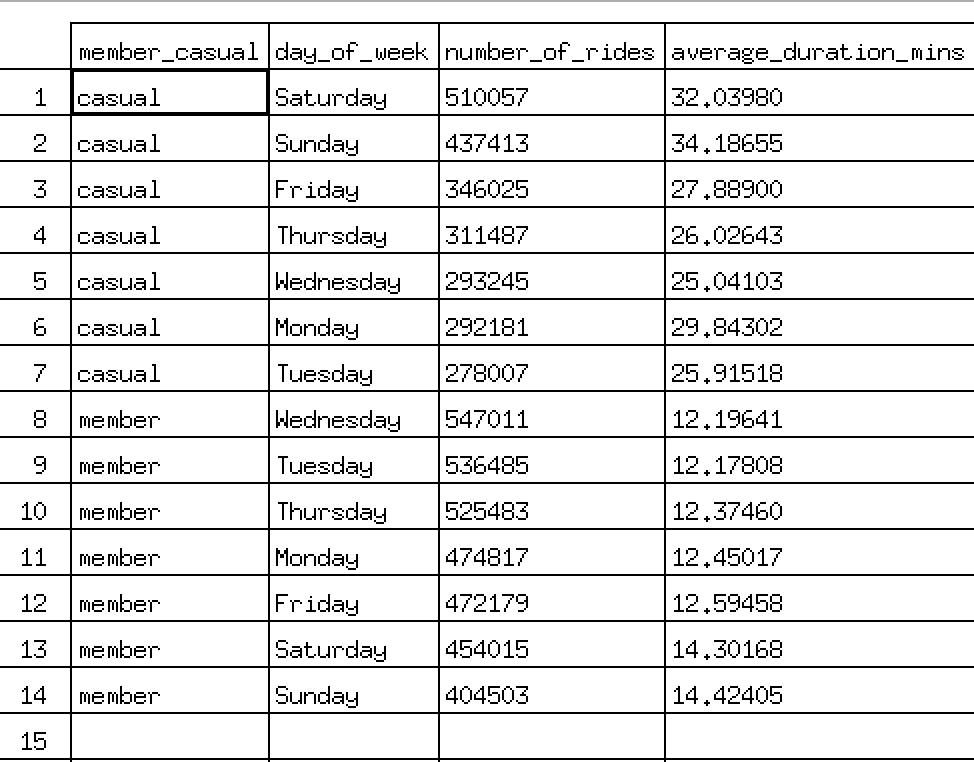

In [ ]:
# fix the order for the month variable so that they show up in the same sequence in output tables and visualizations 
all_trip_data_v2$month <- ordered(all_trip_data_v2$month, levels=c("Sep_21", "Oct_21", "Nov_21", "Dec_21", "Jan_22", "Feb_22", "Mar_22", "Apr_22", "May_22", "Jun_22", "Jul_22", "Aug_22"))
# a summary of number of trips and avarage trip duration of each customer type in each month during the year
> all_trip_data_v2 %>% 
+          group_by(member_casual, month) %>%  
+           summarise(number_of_rides = n(),average_duration_mins = mean(ride_length)) %>% 
+          arrange(member_casual, desc(number_of_rides)) %>% 
+           View()

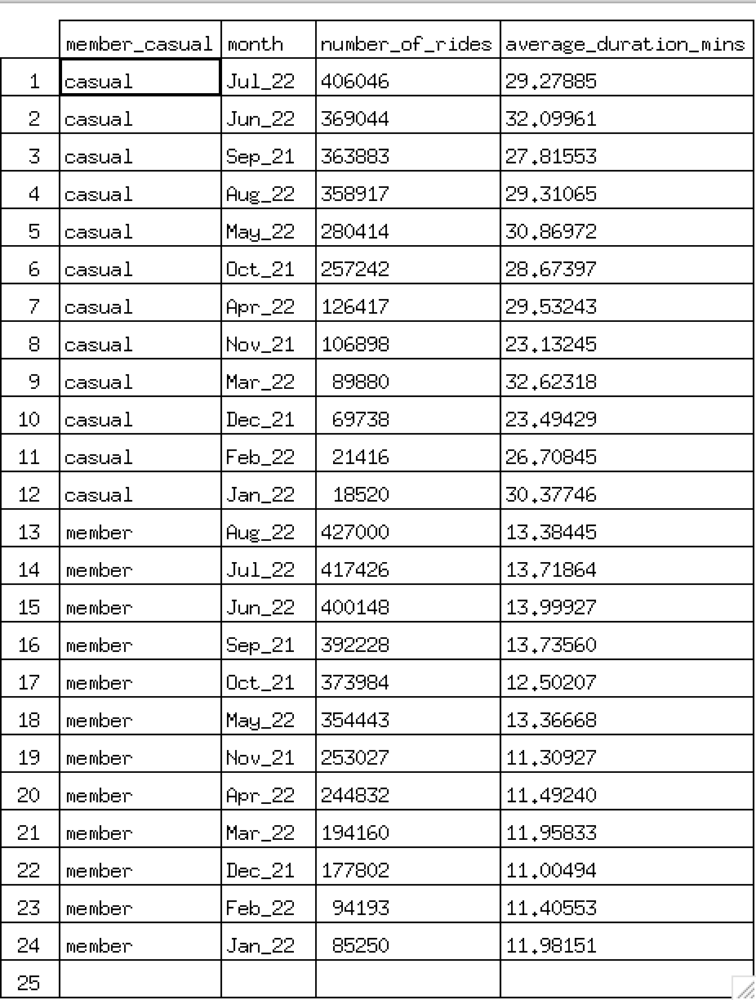

# * Data Visualization 

1.  I use a bar chart to demonstrate the difference in number of trips by each customer type during the whole weeks

In [ ]:
> all_trip_data_v2 %>%  
        group_by(member_casual, day_of_week) %>% 
        summarise(number_of_rides = n()) %>% 
          arrange(member_casual, day_of_week)  %>% 
          ggplot(aes(x = day_of_week, y = number_of_rides, fill = member_casual)) +
          labs(title ="The total of trips by Customer type Vs. Day of the week") +
          geom_col(width=0.5, position = position_dodge(width=0.5), color="red") +
          scale_y_continuous(labels = function(x) format(x, scientific = FALSE)) + 
          scale_fill_brewer(palette="RdPu")+                                                               
          geom_text(aes(label=number_of_rides), vjust=-1, color="black",
          position = position_dodge(0.5), size=2.0)


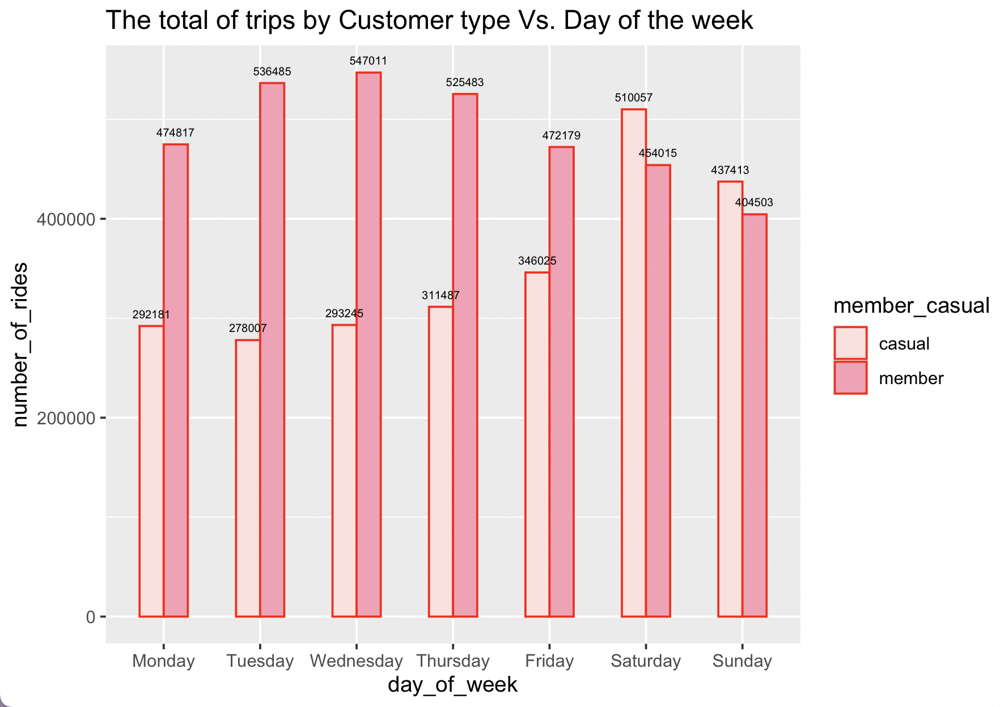

As shown in the bar chart, there are two keys to take away: anual members mostly use bike-share services on weekdays, and casual riders mostly use bike-share services on weekends. With that saying, casual riders mainly use the services for leisure and other purposes since the number of trips during the whole week are not consistent, which is it was going up significantly on weekends. In the other hand, anual members mainly use bikes to commute to work because the number of trips among members are consistent with less spreading over entire week.

2. I use a bar chart to demonstrate the difference in number of trips by each customer type during the year 2021-2022

In [ ]:
> all_trip_data_v2 %>%  
+   group_by(member_casual, month) %>% 
+   summarise(number_of_rides = n()) %>% 
+   arrange(member_casual, month)  %>% 
+   ggplot(aes(x = month, y = number_of_rides, fill = member_casual)) +
+   labs(title ="The total of trips by Customer type Vs. Month") +
+   theme(axis.text.x = element_text(angle = 30)) +
+   geom_col(width=0.5, position = position_dodge(width=0.5), color="red") +
+            scale_y_continuous(labels = function(x) format(x, scientific = FALSE)) + 
+            scale_fill_brewer(palette="RdPu")+                                                               
+           geom_text(aes(label=number_of_rides), vjust=-1, color="black",
+            position = position_dodge(0.5), size=2.0)

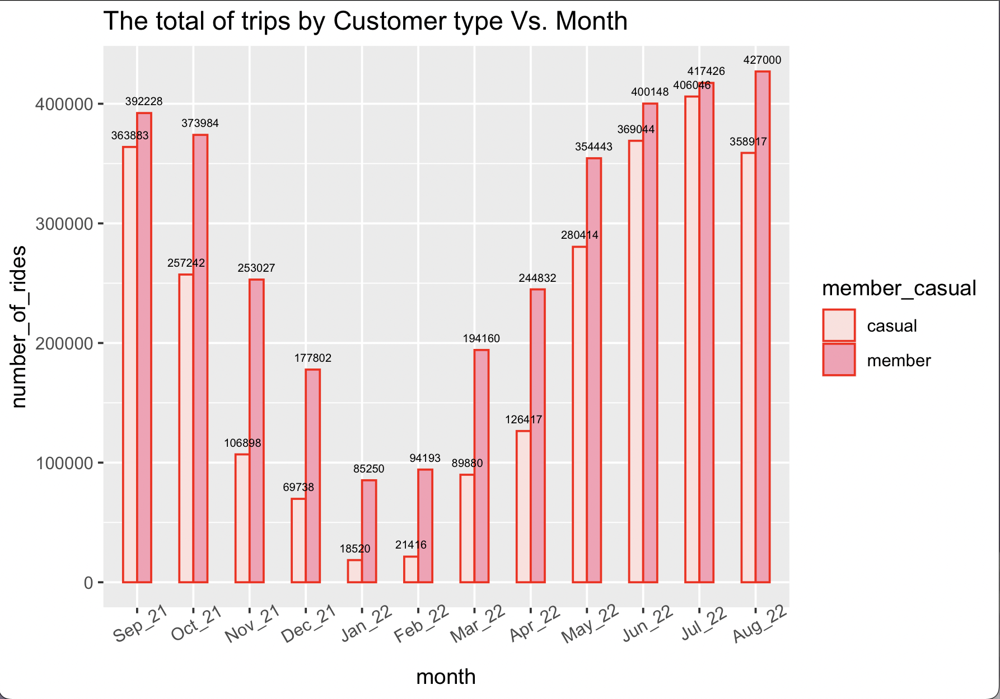

After taking a look over the chart, the data indicates that June, July and August are three months having the largest number of trips. With that saying, summer is the period of the year when both types of customers use bike-share services the most out of other seasons: Spring, Fall, Winter due to some external factors (eg. cold weather, major quality issue) during these seasons that might have hindered with customer needs. One more thing to take away is that the number of trips made by members is consistently higher than the casual riders across all months of the year.

3. I continue using a bar chart to demonstrate the average trip duration during the whole week by each customer type.

In [ ]:
>  all_trip_data_v2 %>%  
+      group_by(member_casual, day_of_week) %>% 
+      summarise(average_trip_duration = mean(ride_length)) %>% 
+       arrange(member_casual, day_of_week)  %>% 
+       ggplot(aes(x = day_of_week, y = average_trip_duration, fill = member_casual)) +
+       labs(title ="The average trip duration of each customer type during the week") +
+       geom_col(width=0.5, position = position_dodge(width=0.5), color="red") +
+        scale_y_continuous(labels = function(x) format(x, scientific = FALSE)) + 
+          scale_fill_brewer(palette="RdPu")+                                                               
+               geom_text(aes(label=average_trip_duration), vjust=-1, color="black",
+               position = position_dodge(0.5), size=2.0)
`summarise()` has grouped output by 'member_casual'. You can override using the `.groups` argument.

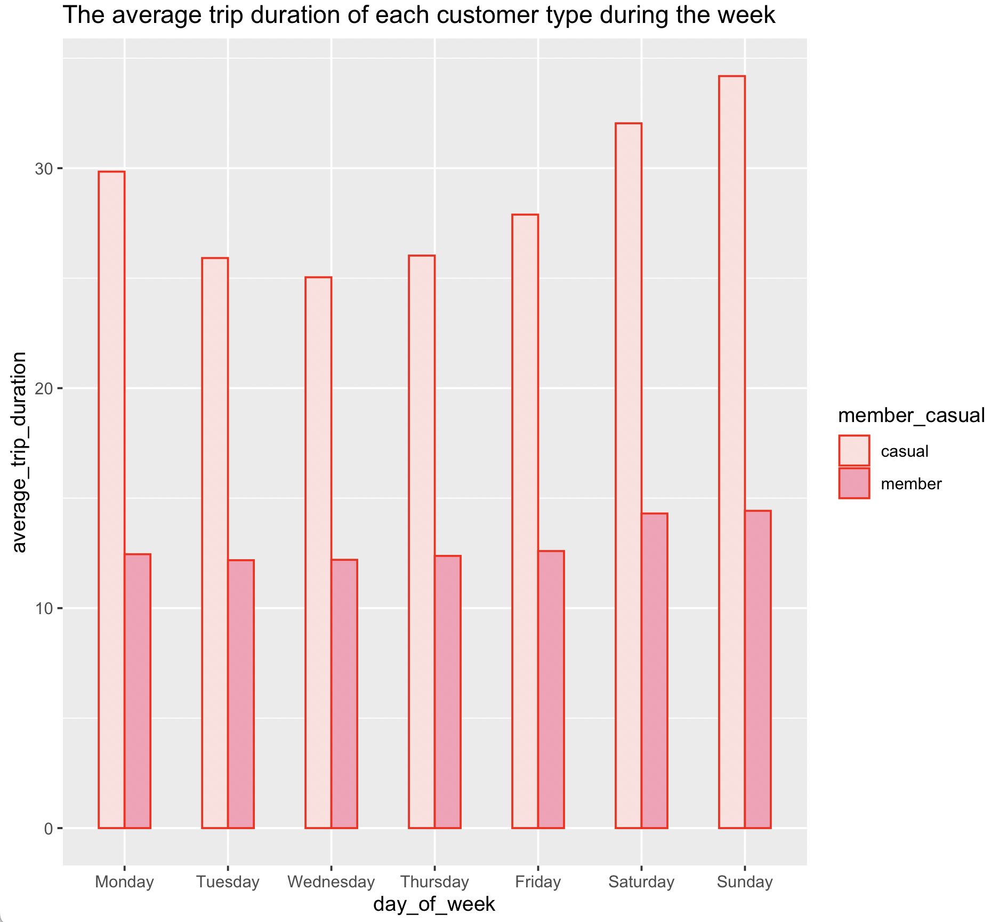

Although the number of trips by casual riders are lower than those by annual members during the week, but the average trip duration by casual riders are twice as high as those by anual members during the week (over 30mins). And it could be because casual riders travel further distance. we also can notice that weekends are where not only the number of trips by casual riders increased significantly but their average trip duration was also higher than weekdays. 

4. Next, a bar chart was also used to demonstrate the average trip duration during the year 2021-2022 by each customer type.

In [ ]:
> all_trip_data_v2 %>%  
+       group_by(member_casual, month) %>% 
+      summarise(average_trip_duration = mean(ride_length)) %>% 
+        arrange(member_casual, month)  %>% 
+        ggplot(aes(x = month, y = average_trip_duration, fill = member_casual)) + theme(axis.text.x = element_text(angle = 30)) +
+          labs(title ="The average trip duration of each customer type during the year") +
+         geom_col(width=0.5, position = position_dodge(width=0.5), color="red") +
+          scale_y_continuous(labels = function(x) format(x, scientific = FALSE)) + scale_fill_brewer(palette="RdPu")                                                             
`summarise()` has grouped output by 'member_casual'. You can override using the `.groups` argument.


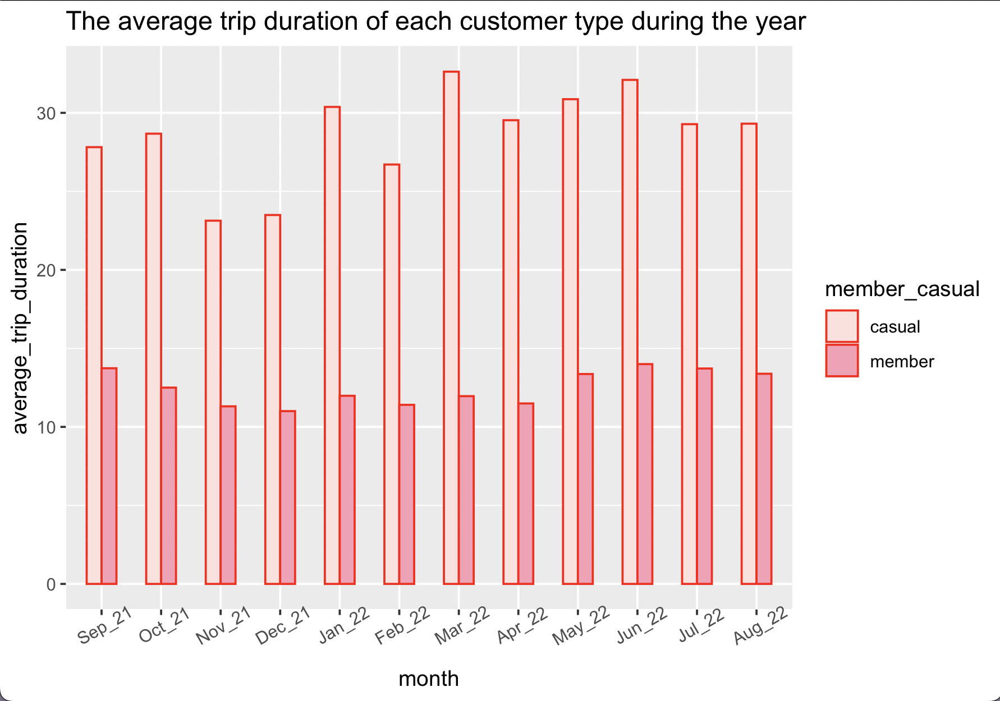

The output is the same as what we observed about trip duration by each cuatomer tyoe during the week. The average trip duration of casual riders is double compared to a member. The average trip duration by casual riders goes from ~25mins to over 30mins every month during the year 2021-2022; in the order hand, the average trip duration by annual members goes between ~10mins to ~15mins.

5. I use a line chart to demonstrate the difference in using bike share service throughout a day by each customer type

In [ ]:
#the times must be in POSIXctonly since only times of class POSIXct are supported in ggplot2:
all_trip_data_v2$time <- as.POSIXct(all_trip_data_v2$time, format = "%H:%M")
all_trip_data_v2 %>%  
+     group_by(member_casual, time) %>% 
+     summarise(number_of_trips = n()) %>%
+     ggplot(aes(x = time, y = number_of_trips, color = member_casual, group = member_casual)) +
+    geom_line() + scale_color_manual(values = c('#C42525', '#1F5E89'))+
+     scale_x_datetime(date_breaks = "1 hour", minor_breaks = NULL,
+                      date_labels = "%H:%M", expand = c(0,0)) +
+     theme(axis.text.x = element_text(angle = 90)) +
+    labs(title ="Bike-share demand over 24 hours of a day", x = "Time of the day") 


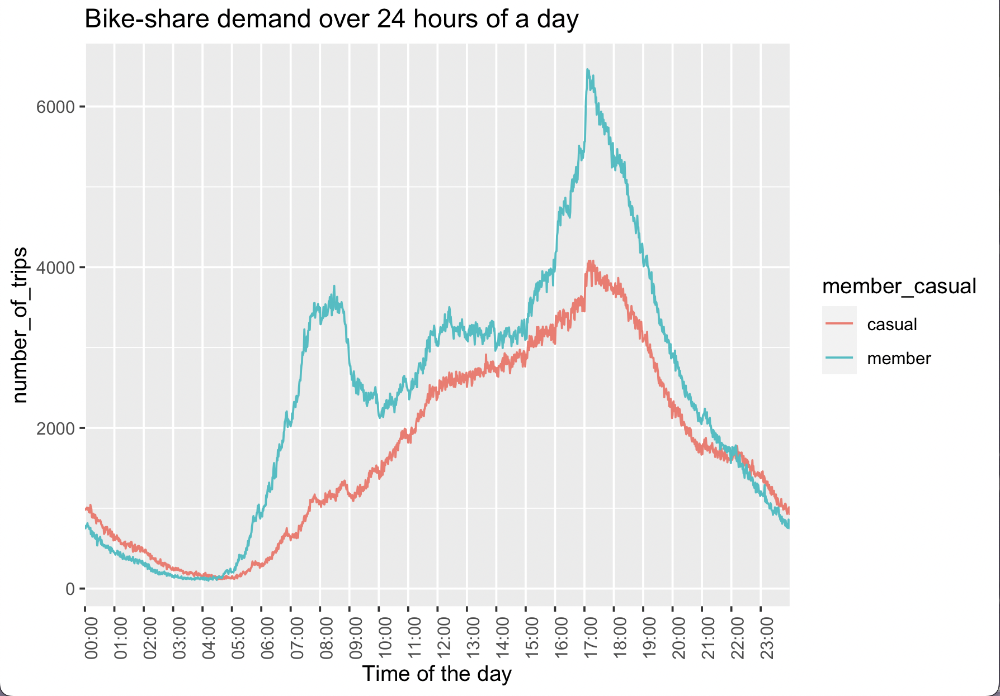

The data shows that for annual members, the peak hours of bike-share service fall in bewteen 7AM-9AM and 4PM-6PM. These two peak hour ranges are usually working hours which are morning hours and evening hours for office workers or most of the jobs, which can indicate that the majority of members are office workers. In the other hand, we can see that the busiest hours of bike-share service fall in bewteen 4PM-7PM, it seems that casual riders are those people who mostly use bikes during their leisure time after work. The other thing we need to notice is that the number of trips by casual riders consitently increase during day time and decrease during night time. 

6. I use a bar chart to demonstrate rideable type preference of each customer type.

In [ ]:
> all_trip_data_v2 %>%
+      group_by(rideable_type, member_casual) %>%
+     summarise(number_of_trips = n()) %>%  
+     ggplot(aes(x= rideable_type, y=number_of_trips, fill= member_casual))+
+                 geom_bar(stat='identity') +
+      scale_y_continuous(labels = function(x) format(x, scientific = FALSE)) +
+     labs(title ="The number of trips per rideable type") +scale_fill_brewer(palette="RdPu")

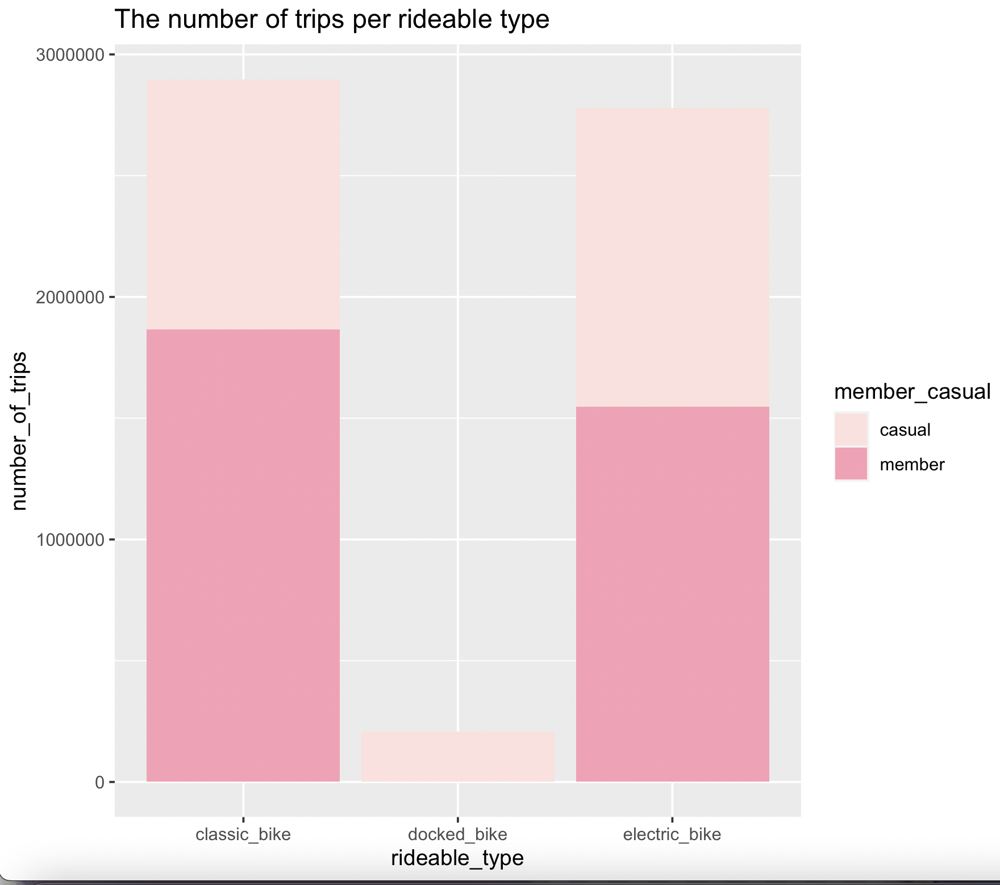

As shown in the chart, classic bikes make up a majority of rideable types being used by customers. Electric bikes are also preferred as much as classic bikes. It shows that all annual members prefer to use classic bikes and electric bikes more than docked bikes. Also, just a few of casual riders use docked bikes.

7. I use Tableau to map the location of 5 busiest starting stations of casual riders and 5 busiest starting stations of anual members

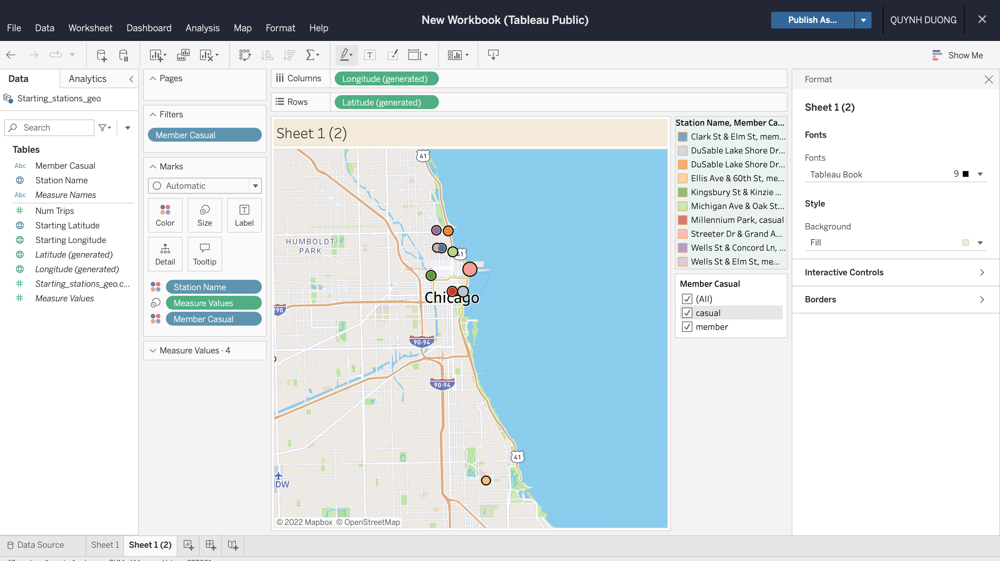

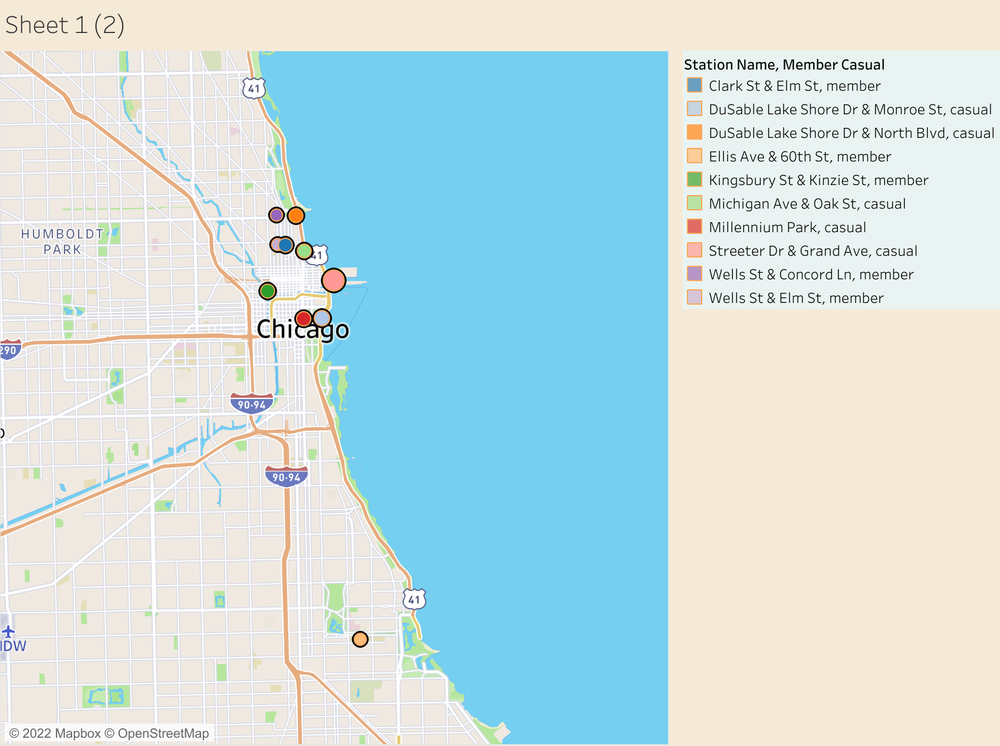

As looking at the map, I can see that the busiest stations for casual riders are surrounded by each other, meaning that they are close to each other. It could be because that these area is the center of the city which attract a lot of tourists. The same as casual riders,the busiest stations for annual members are also close to each other, exept for "Ellis Ave & 60th St", which is far away from the center of the city. 

# * Act Phase

**Summary**:

1. Casual riders make up 58% and anual memebers make up 42% in the total, but the aggratating trip duration of casual riders are higher than the aggratating trip duration of anual members (72320276>43893774).

2. The average trip duration of casual riders is approximately twice as high as the the average trip duration of anual members (from ~25mins to over ~30mins), which indicates that anual members have shorter trip duration than casual riders (from ~10 up to ~15mins).

3. Anual members mostly use bike-share services on weekdays, and casual riders mostly use bike-share services on weekends. 

4. June, July and August are three months having the largest number of trips. With that saying, summer is the period of the year when both types of customers use bike-share services the most out of other seasons: Spring, Fall, Winter due to some external factors (eg. cold weather, major quality issue) during these seasons that might have hindered with customer needs. 

5. The peak hours of bike-share service fall in 7AM-9AM and 4PM-6PM. These two peak hour ranges are usually working hours which are morning hours and evening hours for office workers or most of the jobs, which can indicate that the majority of members are office workers. In the other hand, the busiest hours of bike-share service for casual riders fall in 4PM-7PM, it seems that casual riders are those people who mostly use bikes during their leisure time after work. 

6. Top 5 busiest check_out stations for anual members: Kingsbury St & Kinzie St, Clark St & Elm St, Wells St & Concord Ln, Wells St & Elm St, Ellis Ave & 60th St. Top 5 busiest check_out stations for casual riders:Streeter Dr & Grand Ave, DuSable Lake Shore Dr & Monroe St, Millennium Park, Michigan Ave & Oak St, DuSable Lake Shore Dr & North Blvd.

**Recommendations**

1. Since casual riders usually use our services on weekends, we should offer some benefits of using bike share services on weekends if they become annual members. For example, as a annual member, they can earn points when using our bike share services on weekends. Once they reach 350 points, we will offer a good discount on annual membership fee for renewals 

2. Print-media advertising about membership benefits such as newspapers, magazines, posters  should focus on the top 5 busiest stations for casual riders to reach the target audience.

3. Since the peak ride hours of casual riders fall in 4PM-7PM, we should offer special promotions for annual members outside of those peak ride hours in order to encourage them to using the service more often. This can also be applied on weekdays to stimulate their interest in using bikes for commuting.

4. Since summer is the busiest period of the year for both types of customes, we should promote advertising during these warm months to attract more customers as well as encorage them to have a annual membership with us.

5. Lastly, Cyclistic could co-operate with restaurants and recreational facilities around the top 10 Start locations for both types of customers in order to give out vouchers to new membership like a good discounted pricing at restaurants and at those facilities. 